# Species classification for Ecuador dataset

In [4]:
import tensorflow as tf
import numpy as np
from itertools import cycle
import pandas as pd
import cv2
import matplotlib.pyplot as plt

from sklearn import svm, datasets
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import label_binarize
from sklearn.multiclass import OneVsRestClassifier
from scipy import interp
from sklearn.metrics import roc_auc_score
 

import keras
from keras.models import Sequential
from keras.layers import Dense, Conv2D, MaxPooling2D, BatchNormalization, GlobalAveragePooling2D, Flatten, Dropout, InputLayer
from tensorflow.keras import optimizers, models
from keras.applications.resnet50 import ResNet50
from keras.applications.mobilenet_v2 import MobileNetV2
from tensorflow.keras.utils import to_categorical
from keras.models import Model
from keras.models import Sequential
from keras import optimizers
from keras.applications.mobilenet_v2 import preprocess_input
from tensorflow.keras.preprocessing.image import ImageDataGenerator




import torch 
from torchvision import transforms



In [3]:
def train_model_basic():

    IMG_SIZE = 224

    model = Sequential()
    model.add(Conv2D(64, kernel_size=6, activation='relu', input_shape=(IMG_SIZE, IMG_SIZE, 3)))
    model.add(MaxPooling2D(pool_size=(2,2)))
    model.add(BatchNormalization(momentum=0.01))

    model.add(Conv2D(64, kernel_size=3, activation='relu'))
    model.add(MaxPooling2D(pool_size=(2,2)))
    model.add(BatchNormalization(momentum=0.01))

    model.add(Conv2D(32, kernel_size=3, activation='relu'))
    model.add(MaxPooling2D(pool_size=(2,2)))
    model.add(BatchNormalization(momentum=0.01))

    model.add(Conv2D(32, kernel_size=3, activation='relu'))
    model.add(MaxPooling2D(pool_size=(2,2)))
    model.add(BatchNormalization(momentum=0.01))

    model.add(Flatten())
    model.add(Dense(128, activation='relu'))
    model.add(Dense(1, activation='sigmoid'))

    epochs = 5
    learning_rate = 0.01
    decay_rate = learning_rate / epochs
    momentum = 0.8
    opt = tf.keras.optimizers.SGD(lr=learning_rate, momentum=momentum, decay=decay_rate, nesterov=False)

    model.compile(loss='binary_crossentropy',
                optimizer=opt,
                metrics=['accuracy'])

    return(model)
    

In [4]:
def train_model():
    base_model = MobileNetV2(include_top = False, input_shape=(224, 224, 3))
    #base_model = MobileNetV2(include_top = False, weights = None,  input_shape=(224, 224, 3))
    base_model.trainable = False
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(128, activation = tf.nn.relu)(x)
    preds = Dense(1, activation = tf.nn.sigmoid)(x)

    model= Model(inputs=base_model.input,outputs=preds)

    for layer in model.layers[-20:]:
        layer.trainable = False

    epochs = 5
    learning_rate = 0.01
    decay_rate = learning_rate / epochs
    momentum = 0.8
    opt = tf.keras.optimizers.SGD(lr=learning_rate, momentum=momentum, decay=decay_rate, nesterov=False)

    model.compile(loss='binary_crossentropy',
                optimizer=opt,
                metrics=['accuracy'])

    return(model)

In [5]:
X_test_1 = np.load('cnn/test/patches.npy')
y_test_1 = np.load('cnn/test/labels.npy')


X_test_2 = np.load('cnn/test/patches_2.npy')
y_test_2 = np.load('cnn/test/labels_2.npy')


XX = np.concatenate((X_test_1, X_test_2), axis = 0)
yy = np.concatenate((y_test_1, y_test_2), axis = 0)
yy = yy.astype(int)



276


In [6]:
def resize_patches(patches, IMG_SIZE):
    n = len(patches)
    resized_patches = []
    for i in range(n):
        resized_patch = cv2.resize(np.array(patches[i], dtype = np.float32), (IMG_SIZE, IMG_SIZE))
        resized_patches.append(resized_patch)
    return(np.array(resized_patches))

In [9]:
def train_on_matching(method, model_choice, X_TEST, y_TEST, hand = False, n_test = None):
        
        N_TEST = len(y_TEST)
        step = int(N_TEST/5)
        PATCHES_TEST = []
        LABELS_TEST = []

        X_TEST = resize_patches(X_TEST, 224)

        randomize = np.arange(len(X_TEST))
        np.random.shuffle(randomize)
        X_TEST = X_TEST[randomize]
        y_TEST = y_TEST[randomize]


        for i in range(5):
                PATCHES_TEST.append(X_TEST[i*step:(i+1)*step])
                LABELS_TEST.append(y_TEST[i*step:(i+1)*step])
                
        
        
        dir = 'cnn/train_{}'.format(method)
        patches_pos = np.load(os.path.join(dir, 'patches_pos.npy'))
        patches_neg = np.load(os.path.join(dir, 'patches_neg.npy'))


        if hand == True:
                patches_hand_pos = np.load('cnn/train_hand/patches_pos.npy')
                patches_hand_neg = np.load('cnn/train_hand/patches_neg.npy')
                # Choose to join handlabeled training set 
                patches_pos = np.concatenate((patches_pos, patches_hand_pos), axis=0)
                patches_neg = np.concatenate((patches_neg, patches_hand_neg), axis=0)


        n_pos = len(patches_pos)
        n_neg = len(patches_neg)
        print(n_pos, n_neg)

        #Rebalance
        #n_min = min(n_pos, n_neg)

        #patches_pos = patches_pos[np.random.choice(len(patches_pos), size=n_min, replace=False)]
        #patches_neg = patches_neg[np.random.choice(len(patches_neg), size=n_min, replace=False)]
        y_pos = np.array([0]*n_pos)
        y_neg = np.array([1]*n_neg)

        X = np.concatenate((patches_pos, patches_neg), axis=0)
        y = np.concatenate((y_pos, y_neg), axis=0)

        randomize = np.arange(len(X))
        np.random.shuffle(randomize)
        X = X[randomize]
        y = y[randomize]

        X = resize_patches(X, 224)
    
        if model_choice == 'basic':
                X_train, X_val, y_train, y_val = train_test_split(X, y, test_size = 0.15, random_state = 2)

                train_species = ImageDataGenerator(rescale = 1/255)
                validation_species = ImageDataGenerator(rescale = 1/255)

                # Flow training images in batches of 120 using train_datagen generator
                train_generator = train_species.flow( X_train, y_train, # All images will be resized to 200x200
                        batch_size=64)

                # Flow validation images in batches of 19 using valid_datagen generator
                validation_generator = validation_species.flow(X_val, y_val,  # All images will be resized to 200x200
                        batch_size=64,
                        shuffle=False)

                model = train_model_basic()

        if model_choice == 'mobilenetv2':

                X_train, X_val, y_train, y_val = train_test_split(X, y, test_size = 0.15, random_state = 2)

                train_species = ImageDataGenerator(preprocessing_function=preprocess_input)
                validation_species = ImageDataGenerator(preprocessing_function=preprocess_input)
                # Flow training images in batches of 120 using train_datagen generator
                train_generator = train_species.flow( X_train, y_train, # All images will be resized to 200x200
                        batch_size=64)

                # Flow validation images in batches of 19 using valid_datagen generator
                validation_generator = validation_species.flow(X_val, y_val,  # All images will be resized to 200x200
                        batch_size=64,
                        shuffle=False)

                model = train_model()


        history = model.fit(train_generator,  
        epochs=5,
        verbose=1,
        validation_data = validation_generator) 
        #use_multiprocessing=True, workers=8)


        acc_tests = []

        if n_test == 1:
                if model_choice == 'basic':
                        X_TEST = X_TEST/255
                if model_choice == 'mobilenetv2':
                        X_TEST = preprocess_input(X_TEST)

                # predict probabilities for test set
                yhat_probs = model.predict(X_TEST, verbose=0)
                # predict crisp classes for test set
                yhat_classes = yhat_probs.round()


                # accuracy: (tp + tn) / (p + n)
                accuracy = accuracy_score(y_TEST, yhat_classes)
                print('Accuracy: %f' % accuracy)
                acc_tests.append(accuracy)
        
        else:
                for i in range(len(PATCHES_TEST)):
                        X_test = PATCHES_TEST[i]
                        y_test = LABELS_TEST[i]
                        if model_choice == 'basic':
                                X_test = X_test/255
                        if model_choice == 'mobilenetv2':
                                X_test = preprocess_input(X_test)

                        # predict probabilities for test set
                        yhat_probs = model.predict(X_test, verbose=0)
                        # predict crisp classes for test set
                        yhat_classes = yhat_probs.round()

                        for i in range(3):
                                print('label is: ', y_test[i])
                                print('class predicted is: ', yhat_classes[i])
                                plt.imshow(X_test[i])
                                plt.show()
                        print('classes: ', yhat_classes[:3])
                        print('y_test: ', y_test[:3])


                        # accuracy: (tp + tn) / (p + n)
                        accuracy = accuracy_score(y_test, yhat_classes)
                        print('Accuracy: %f' % accuracy)
                        acc_tests.append(accuracy)

        return(acc_tests)

hand
163 237
[[[214.62297  196.99953  184.21976 ]
  [200.71082  184.99873  174.02954 ]
  [198.71416  182.33855  172.2065  ]
  ...
  [255.       255.       255.      ]
  [255.       255.       255.      ]
  [255.       255.       255.      ]]

 [[212.3547   197.3899   179.61977 ]
  [211.73894  194.78195  182.98582 ]
  [207.56871  192.85362  180.85756 ]
  ...
  [255.       255.       255.      ]
  [255.       255.       255.      ]
  [255.       255.       255.      ]]

 [[219.89322  205.01416  186.89386 ]
  [221.1816   205.09338  190.13112 ]
  [220.77917  207.94336  194.03236 ]
  ...
  [255.       255.       255.      ]
  [255.       255.       255.      ]
  [255.       255.       255.      ]]

 ...

 [[164.96605  172.65005  116.22528 ]
  [176.99715  183.4757   123.103424]
  [173.64107  181.83893  119.046425]
  ...
  [185.55048  205.92404  147.14716 ]
  [202.6242   226.22284  175.12303 ]
  [188.56062  216.73817  150.1369  ]]

 [[174.4055   178.82805  124.86185 ]
  [176.95128  180.5948  

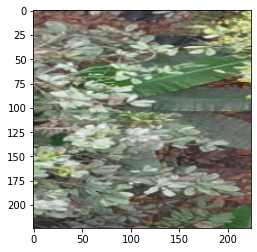

label is:  1
class predicted is:  [0.]
label is:  1
class predicted is:  [0.]
classes:  [[1.]
 [0.]
 [0.]]
y_test:  [1 1 1]
Accuracy: 0.654545
label is:  1
class predicted is:  [0.]
label is:  0
class predicted is:  [0.]


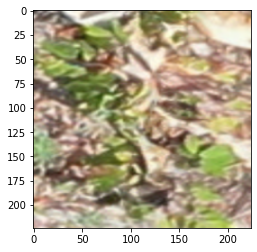

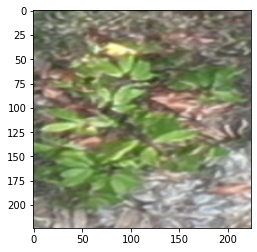

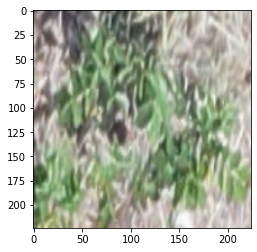

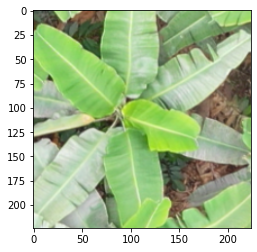

label is:  0
class predicted is:  [0.]
classes:  [[0.]
 [0.]
 [0.]]
y_test:  [1 0 0]
Accuracy: 0.727273


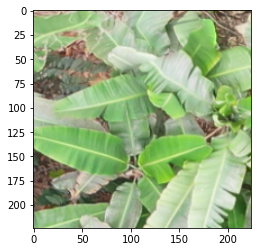

label is:  1
class predicted is:  [0.]
label is:  1
class predicted is:  [1.]


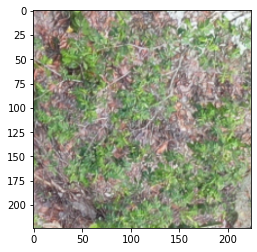

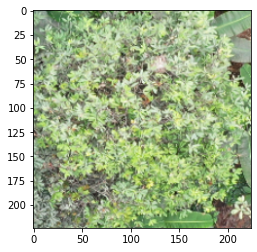

label is:  0
class predicted is:  [0.]
classes:  [[0.]
 [1.]
 [0.]]
y_test:  [1 1 0]
Accuracy: 0.636364
label is:  0
class predicted is:  [0.]
label is:  0
class predicted is:  [1.]


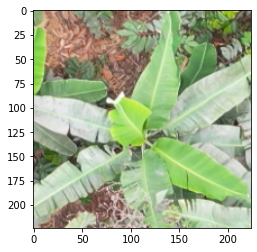

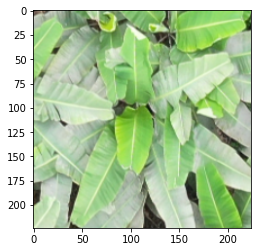

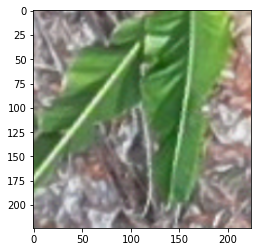

label is:  1
class predicted is:  [0.]
classes:  [[0.]
 [1.]
 [0.]]
y_test:  [0 0 1]
Accuracy: 0.672727


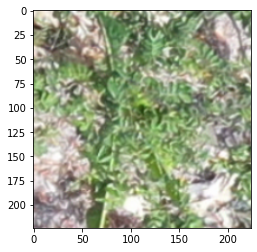

label is:  1
class predicted is:  [0.]
label is:  0
class predicted is:  [0.]


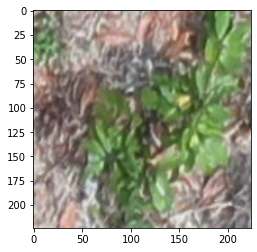

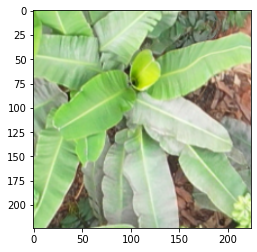

label is:  1
class predicted is:  [1.]


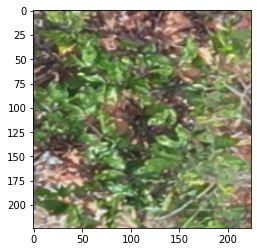

classes:  [[0.]
 [0.]
 [1.]]
y_test:  [1 0 1]
Accuracy: 0.709091
   accuracy method  test
0  0.654545   hand     1
1  0.727273   hand     2
2  0.636364   hand     3
3  0.672727   hand     4
4  0.709091   hand     5
nn
1503 3161
[[[183.0125   191.9625   161.0625  ]
  [183.05984  192.75783  160.32399 ]
  [179.43268  193.64424  157.07011 ]
  ...
  [226.21411  222.62595  216.61345 ]
  [228.25201  225.27702  219.26453 ]
  [229.       226.025    220.0125  ]]

 [[183.71541  189.31876  165.14352 ]
  [186.97313  192.67285  165.70824 ]
  [186.93933  197.39743  164.40921 ]
  ...
  [227.73509  225.8624   218.91956 ]
  [228.59653  227.27913  220.37488 ]
  [228.71675  227.39934  220.49509 ]]

 [[181.2143   185.56361  164.69865 ]
  [186.54944  190.37126  166.51114 ]
  [190.61824  197.14987  167.16795 ]
  ...
  [220.80602  220.40929  210.99702 ]
  [221.82806  220.72545  212.19531 ]
  [221.86273  220.72545  212.19531 ]]

 ...

 [[135.72322  154.81473  122.689735]
  [138.82068  158.66965  125.52597 ]
  

WARNING - Callbacks method `on_train_batch_end` is slow compared to the batch time (batch time: 0.1050s vs `on_train_batch_end` time: 0.1735s). Check your callbacks.


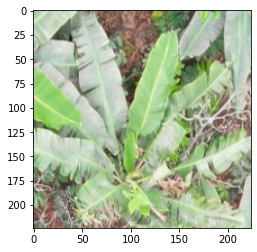

label is:  1
class predicted is:  [1.]
label is:  1
class predicted is:  [1.]
classes:  [[1.]
 [1.]
 [1.]]
y_test:  [0 1 1]
Accuracy: 0.545455


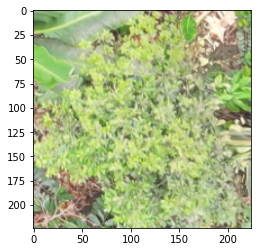

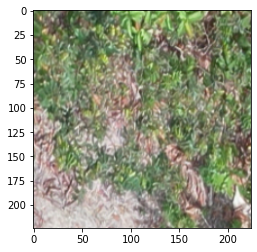

label is:  0
class predicted is:  [1.]
label is:  0
class predicted is:  [1.]


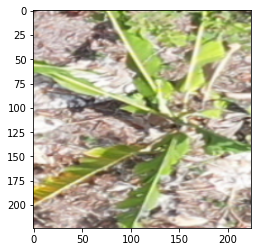

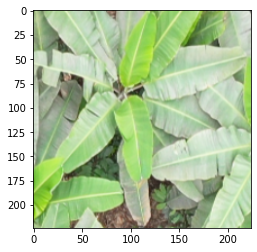

label is:  0
class predicted is:  [1.]
classes:  [[1.]
 [1.]
 [1.]]
y_test:  [0 0 0]
Accuracy: 0.418182


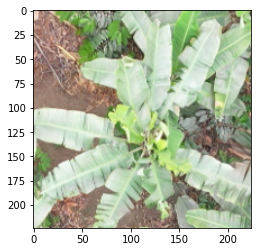

label is:  0
class predicted is:  [0.]
label is:  1
class predicted is:  [1.]


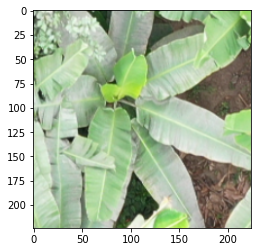

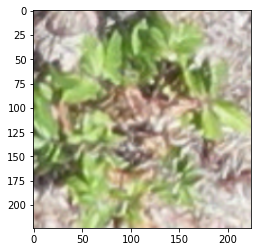

label is:  0
class predicted is:  [1.]
classes:  [[0.]
 [1.]
 [1.]]
y_test:  [0 1 0]
Accuracy: 0.509091


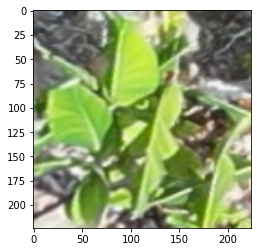

label is:  0
class predicted is:  [1.]
label is:  1
class predicted is:  [1.]


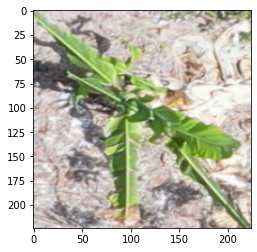

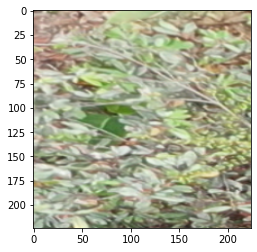

label is:  1
class predicted is:  [0.]
classes:  [[1.]
 [1.]
 [0.]]
y_test:  [0 1 1]
Accuracy: 0.490909


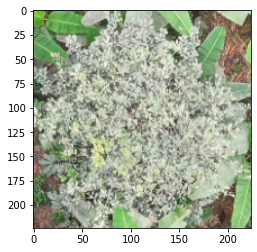

label is:  0
class predicted is:  [0.]
label is:  0
class predicted is:  [0.]


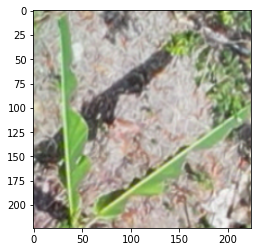

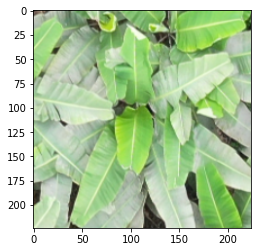

label is:  1
class predicted is:  [0.]
classes:  [[0.]
 [0.]
 [0.]]
y_test:  [0 0 1]
Accuracy: 0.436364


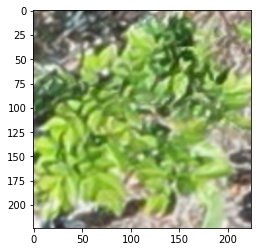

   accuracy method  test
0  0.545455     nn     1
1  0.418182     nn     2
2  0.509091     nn     3
3  0.490909     nn     4
4  0.436364     nn     5
gmn
1504 3161
[[[149.95     154.1525   155.1525  ]
  [145.56693  150.23732  150.30153 ]
  [141.46649  146.31937  145.59534 ]
  ...
  [156.50255  203.25824   95.78739 ]
  [152.60185  202.27405   93.70504 ]
  [152.975    203.7725    96.785   ]]

 [[129.93513  135.31683  134.78723 ]
  [130.81625  136.66585  135.67758 ]
  [133.01643  138.82187  137.49776 ]
  ...
  [142.73856  183.224     86.6101  ]
  [135.68764  177.609     78.732445]
  [134.55478  177.03496   77.47304 ]]

 [[122.119644 128.72835  124.078575]
  [122.27025  129.68515  124.25184 ]
  [124.21062  131.79228  125.4105  ]
  ...
  [ 97.241806 134.8554    40.588505]
  [ 94.94127  130.95296   34.5416  ]
  [101.76741  135.55312   37.497322]]

 ...

 [[122.57991  162.61095   52.38951 ]
  [130.58344  168.40456   59.5976  ]
  [139.43651  176.43376   67.19182 ]
  ...
  [160.99768  202.07753

WARNING - Callbacks method `on_train_batch_end` is slow compared to the batch time (batch time: 0.1094s vs `on_train_batch_end` time: 0.1773s). Check your callbacks.


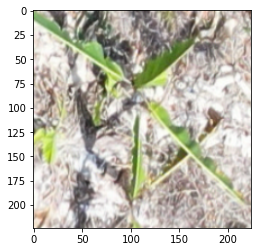

label is:  0
class predicted is:  [1.]
label is:  0
class predicted is:  [0.]


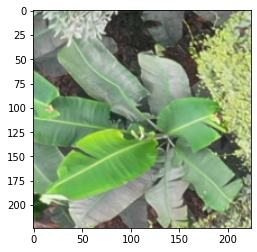

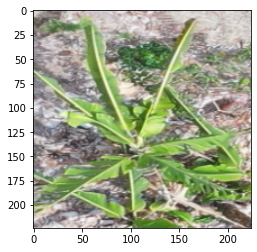

classes:  [[1.]
 [1.]
 [0.]]
y_test:  [0 0 0]
Accuracy: 0.636364
label is:  0
class predicted is:  [0.]


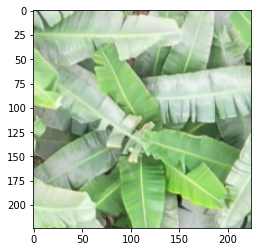

label is:  0
class predicted is:  [1.]


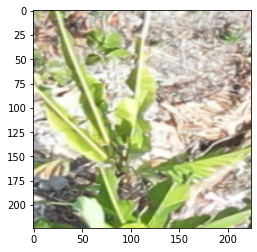

label is:  0
class predicted is:  [1.]
classes:  [[0.]
 [1.]
 [1.]]
y_test:  [0 0 0]
Accuracy: 0.509091


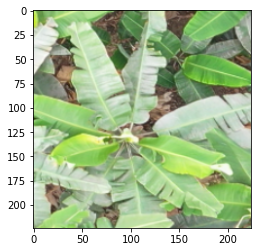

label is:  1
class predicted is:  [1.]
label is:  1
class predicted is:  [1.]


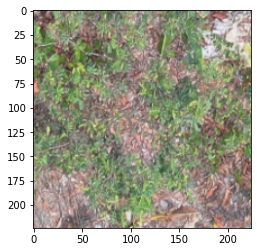

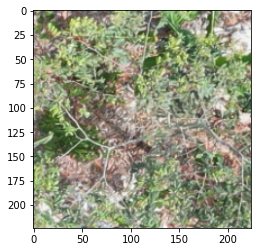

label is:  0
class predicted is:  [0.]
classes:  [[1.]
 [1.]
 [0.]]
y_test:  [1 1 0]
Accuracy: 0.527273


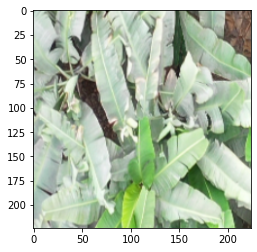

label is:  1
class predicted is:  [1.]
label is:  0
class predicted is:  [0.]


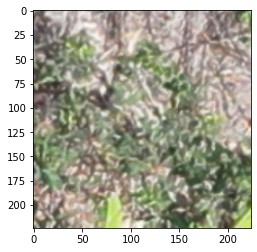

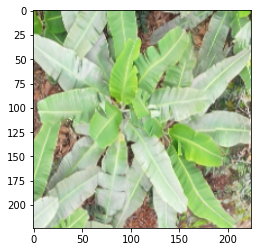

label is:  1
class predicted is:  [1.]
classes:  [[1.]
 [0.]
 [1.]]
y_test:  [1 0 1]
Accuracy: 0.618182


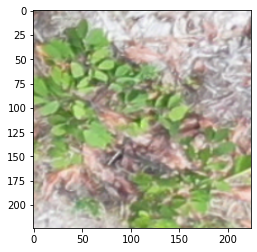

label is:  0
class predicted is:  [1.]
label is:  0
class predicted is:  [1.]


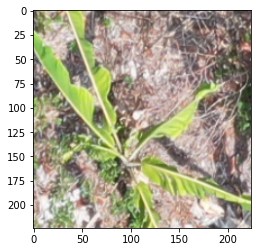

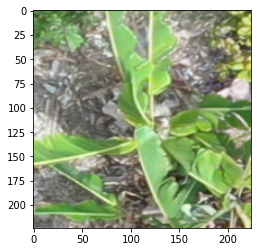

label is:  1
class predicted is:  [1.]
classes:  [[1.]
 [1.]
 [1.]]
y_test:  [0 0 1]
Accuracy: 0.581818


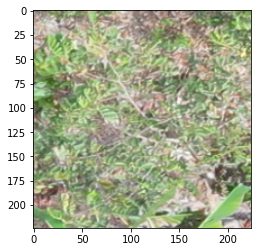

   accuracy method  test
0  0.636364    gmn     1
1  0.509091    gmn     2
2  0.527273    gmn     3
3  0.618182    gmn     4
4  0.581818    gmn     5
gw
1503 3161
[[[145.4288   168.15762   79.29053 ]
  [162.52278  183.0201    85.48835 ]
  [150.27533  174.32745   73.542786]
  ...
  [192.46211  217.58641  180.40395 ]
  [194.3851   217.51329  183.7818  ]
  [184.51169  209.43355  176.79971 ]]

 [[104.58513  123.46969   42.409706]
  [118.12608  138.3648    50.471382]
  [117.89687  135.098     45.989513]
  ...
  [192.91039  217.33961  180.741   ]
  [195.18718  218.83447  183.95613 ]
  [194.95029  218.09473  184.35493 ]]

 [[101.533264 118.54482   45.66072 ]
  [ 99.720604 118.013176  39.855755]
  [106.99502  121.675934  45.41411 ]
  ...
  [193.8659   217.07365  180.8735  ]
  [195.15413  216.46819  181.04124 ]
  [201.47862  221.77818  189.17435 ]]

 ...

 [[205.76768  214.70558  190.97267 ]
  [198.86615  207.52855  182.63011 ]
  [182.27264  194.25421  163.40523 ]
  ...
  [151.44713  150.67928 

WARNING - Callbacks method `on_train_batch_end` is slow compared to the batch time (batch time: 0.1052s vs `on_train_batch_end` time: 0.1740s). Check your callbacks.


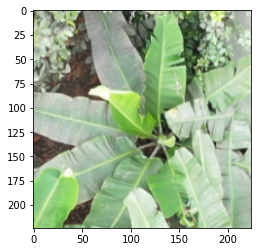

label is:  1
class predicted is:  [1.]
label is:  1
class predicted is:  [1.]


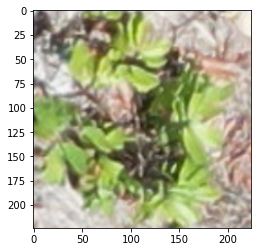

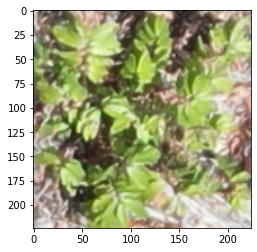

classes:  [[0.]
 [1.]
 [1.]]
y_test:  [0 1 1]
Accuracy: 0.509091
label is:  0
class predicted is:  [1.]
label is:  0
class predicted is:  [1.]


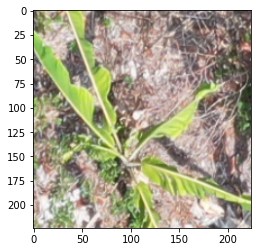

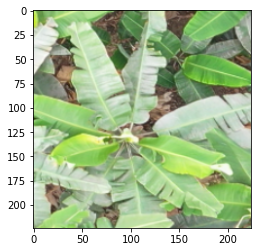

label is:  1
class predicted is:  [1.]


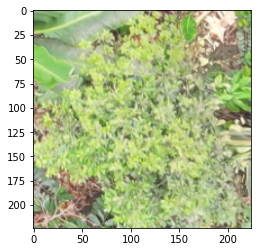

classes:  [[1.]
 [1.]
 [1.]]
y_test:  [0 0 1]
Accuracy: 0.727273
label is:  1
class predicted is:  [1.]


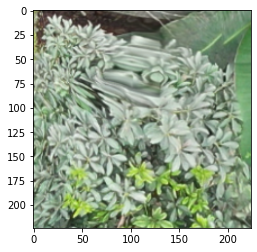

label is:  0
class predicted is:  [1.]
label is:  0
class predicted is:  [1.]


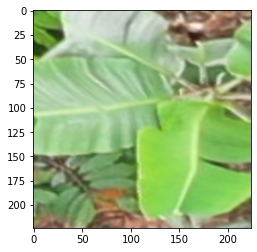

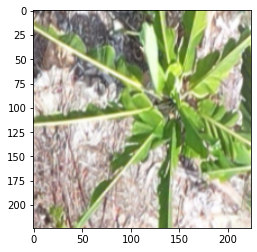

classes:  [[1.]
 [1.]
 [1.]]
y_test:  [1 0 0]
Accuracy: 0.490909
label is:  1
class predicted is:  [0.]


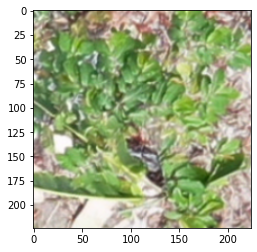

label is:  0
class predicted is:  [1.]
label is:  0
class predicted is:  [1.]


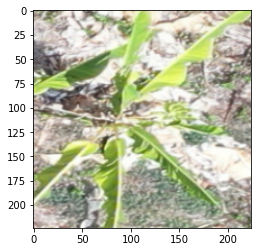

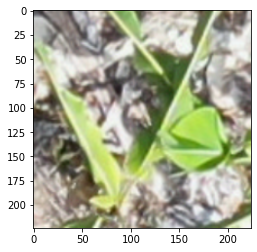

classes:  [[0.]
 [1.]
 [1.]]
y_test:  [1 0 0]
Accuracy: 0.363636
label is:  1
class predicted is:  [1.]
label is:  1
class predicted is:  [1.]


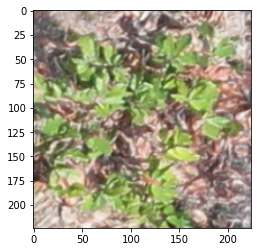

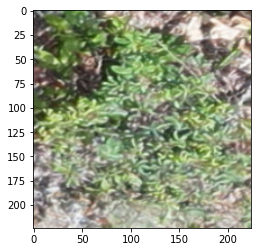

label is:  0
class predicted is:  [1.]
classes:  [[1.]
 [1.]
 [1.]]
y_test:  [1 1 0]
Accuracy: 0.418182


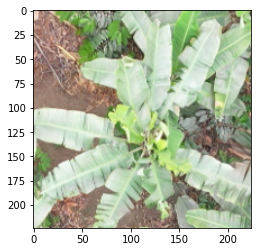

   accuracy method  test
0  0.509091     gw     1
1  0.727273     gw     2
2  0.490909     gw     3
3  0.363636     gw     4
4  0.418182     gw     5
ot_greedy
1504 3161
[[[151.48581  208.6925    83.006935]
  [141.34666  201.28584   75.74628 ]
  [125.31998  186.6711    65.76127 ]
  ...
  [135.1394   106.18143   91.30893 ]
  [111.05139   74.1426    59.52498 ]
  [136.17525   87.33968   73.87913 ]]

 [[161.09973  216.78873   90.97281 ]
  [156.20065  213.34253   87.21795 ]
  [138.68788  197.99455   74.20926 ]
  ...
  [115.77185   81.23425   67.06979 ]
  [122.9068    84.86876   68.988335]
  [150.21434  107.70957   88.37873 ]]

 [[142.51958  203.18439   70.42152 ]
  [156.93211  214.56465   86.305504]
  [147.37727  207.7853    79.498985]
  ...
  [125.63102   85.61773   71.8251  ]
  [136.13664   93.25795   76.67934 ]
  [161.38991  118.953445  98.18204 ]]

 ...

 [[208.68886  201.63173  186.65009 ]
  [191.2832   183.20856  166.66252 ]
  [201.5087   189.62125  169.11812 ]
  ...
  [214.30289  207

WARNING - Callbacks method `on_train_batch_end` is slow compared to the batch time (batch time: 0.1042s vs `on_train_batch_end` time: 0.1715s). Check your callbacks.


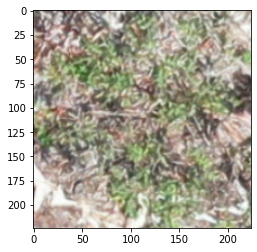

label is:  1
class predicted is:  [1.]


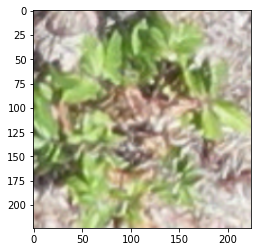

label is:  0
class predicted is:  [1.]


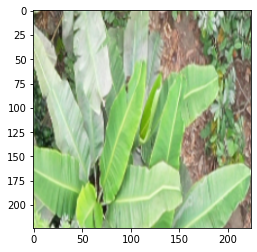

classes:  [[0.]
 [1.]
 [1.]]
y_test:  [1 1 0]
Accuracy: 0.454545
label is:  0
class predicted is:  [1.]


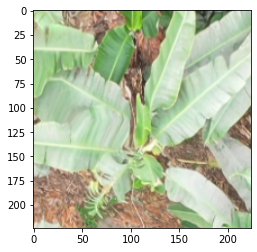

label is:  1
class predicted is:  [1.]


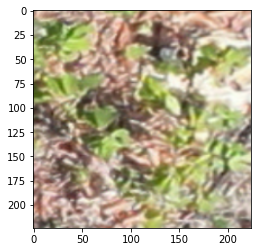

label is:  0
class predicted is:  [1.]
classes:  [[1.]
 [1.]
 [1.]]
y_test:  [0 1 0]
Accuracy: 0.436364
label is:  1
class predicted is:  [0.]


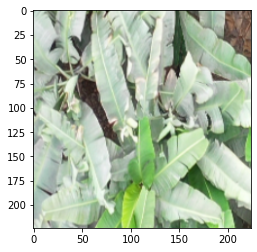

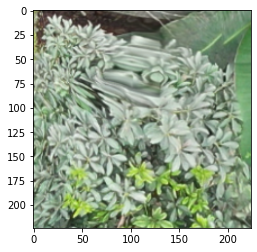

label is:  0
class predicted is:  [1.]
label is:  1
class predicted is:  [1.]


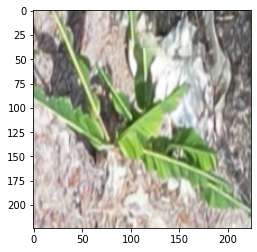

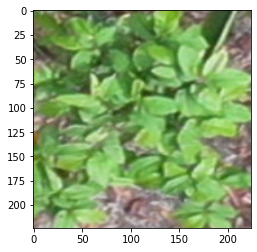

classes:  [[0.]
 [1.]
 [1.]]
y_test:  [1 0 1]
Accuracy: 0.472727
label is:  0
class predicted is:  [1.]
label is:  0
class predicted is:  [0.]


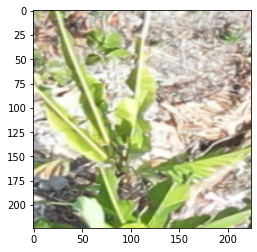

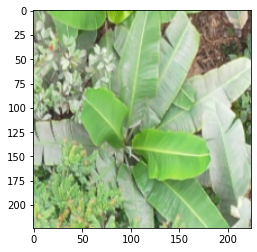

label is:  1
class predicted is:  [0.]
classes:  [[1.]
 [0.]
 [0.]]
y_test:  [0 0 1]
Accuracy: 0.472727
label is:  1
class predicted is:  [1.]


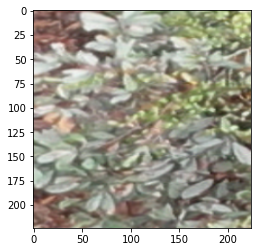

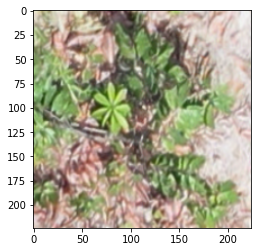

label is:  1
class predicted is:  [1.]
label is:  0
class predicted is:  [1.]
classes:  [[1.]
 [1.]
 [1.]]
y_test:  [1 1 0]
Accuracy: 0.581818
   accuracy     method  test
0  0.454545  ot_greedy     1
1  0.436364  ot_greedy     2
2  0.472727  ot_greedy     3
3  0.472727  ot_greedy     4
4  0.581818  ot_greedy     5
ot_non_greedy


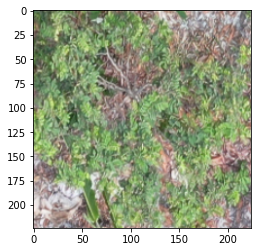

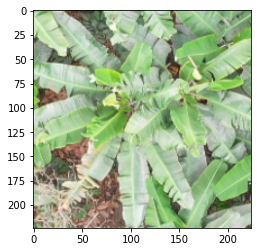

2685 5434
[[[127.859276 179.96573   65.219025]
  [119.48618  173.69173   52.562134]
  [117.27848  169.74327   50.1589  ]
  ...
  [177.57407  184.45235  158.30319 ]
  [180.33844  189.76888  160.9996  ]
  [195.44467  201.33417  169.97522 ]]

 [[117.23087  169.99413   50.824352]
  [116.006935 168.87685   41.795513]
  [113.010086 166.71141   41.91196 ]
  ...
  [189.13428  197.20161  170.68999 ]
  [169.2388   176.33707  149.633   ]
  [164.9848   173.80946  143.94266 ]]

 [[108.290794 161.46442   39.2689  ]
  [108.05167  160.33633   38.20475 ]
  [107.060555 161.88907   36.985336]
  ...
  [195.71288  206.29474  179.04474 ]
  [196.92323  202.96698  178.08235 ]
  [178.03728  188.11873  164.01295 ]]

 ...

 [[182.88931  213.11813  156.02054 ]
  [181.50491  215.38925  153.66605 ]
  [145.75066  176.51567  125.06903 ]
  ...
  [ 79.26982   76.59515   66.97177 ]
  [ 85.36602   79.83863   70.50877 ]
  [ 75.20473   72.49251   65.07511 ]]

 [[187.06624  216.9505   149.39688 ]
  [199.04584  232.58588  16

WARNING - Callbacks method `on_train_batch_end` is slow compared to the batch time (batch time: 0.1088s vs `on_train_batch_end` time: 0.1765s). Check your callbacks.


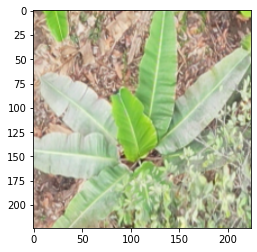

label is:  1
class predicted is:  [1.]
label is:  1
class predicted is:  [1.]


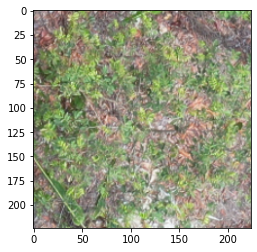

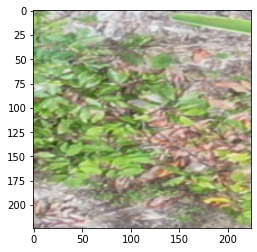

classes:  [[1.]
 [1.]
 [1.]]
y_test:  [0 1 1]
Accuracy: 0.618182
label is:  0
class predicted is:  [1.]
label is:  0
class predicted is:  [0.]


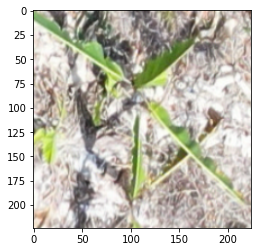

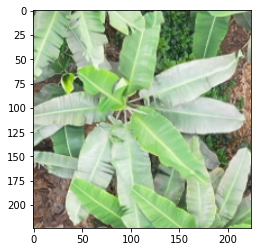

label is:  1
class predicted is:  [1.]
classes:  [[1.]
 [0.]
 [1.]]
y_test:  [0 0 1]
Accuracy: 0.581818
label is:  1
class predicted is:  [0.]


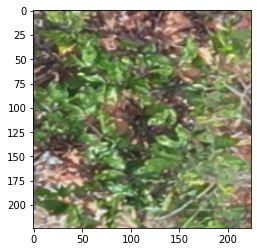

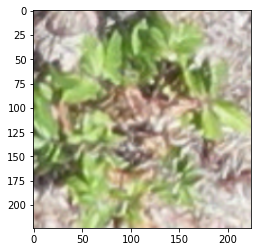

label is:  1
class predicted is:  [1.]
label is:  1
class predicted is:  [1.]


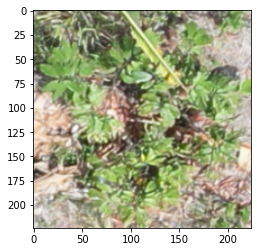

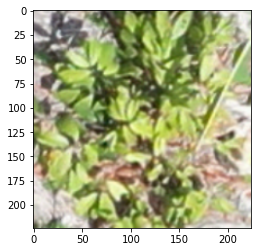

classes:  [[0.]
 [1.]
 [1.]]
y_test:  [1 1 1]
Accuracy: 0.563636
label is:  1
class predicted is:  [1.]
label is:  0
class predicted is:  [1.]


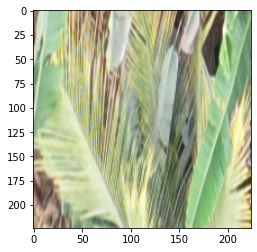

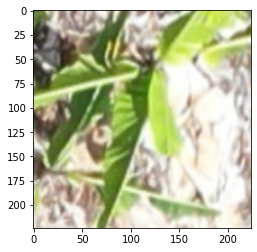

label is:  0
class predicted is:  [1.]
classes:  [[1.]
 [1.]
 [1.]]
y_test:  [1 0 0]
Accuracy: 0.563636


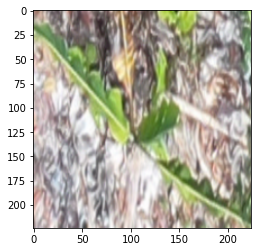

label is:  1
class predicted is:  [1.]
label is:  0
class predicted is:  [0.]


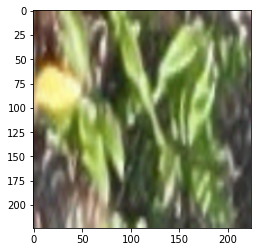

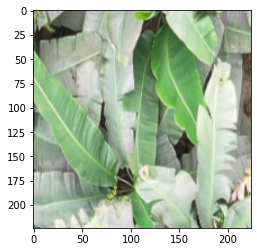

label is:  1
class predicted is:  [1.]
classes:  [[1.]
 [0.]
 [1.]]
y_test:  [1 0 1]
Accuracy: 0.690909
   accuracy         method  test
0  0.618182  ot_non_greedy     1
1  0.581818  ot_non_greedy     2
2  0.563636  ot_non_greedy     3
3  0.563636  ot_non_greedy     4
4  0.690909  ot_non_greedy     5
ot_cnn


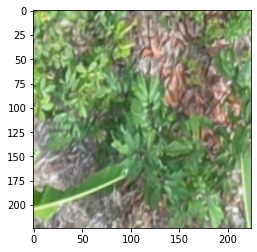

1504 3159
[[[ 88.56084  103.7901    71.335   ]
  [153.03427  166.95415  132.85321 ]
  [197.87889  208.71667  169.9595  ]
  ...
  [ 86.9576   105.195175  64.4565  ]
  [128.53201  146.90475  106.92578 ]
  [174.63881  192.39334  153.85158 ]]

 [[ 84.219604  94.94346   71.54969 ]
  [136.63307  147.9493   117.05528 ]
  [197.61446  209.61818  169.99109 ]
  ...
  [ 97.920944 112.79348   73.54638 ]
  [107.50392  123.773445  83.96524 ]
  [143.70184  161.05972  114.92765 ]]

 [[104.389824 115.3316    91.04933 ]
  [126.41729  137.72115  107.53193 ]
  [197.71982  208.77934  174.19629 ]
  ...
  [123.94422  140.86356  103.03933 ]
  [120.55304  138.80548   97.37006 ]
  [122.985985 140.16862   92.19069 ]]

 ...

 [[137.03929  105.71232   93.25471 ]
  [143.90875  113.99884  100.92326 ]
  [126.79237  100.777916  86.590355]
  ...
  [131.71646  157.51288  129.3551  ]
  [130.98991  158.88664  127.194664]
  [118.42699  145.0223   116.106804]]

 [[130.37755  100.94331   88.750626]
  [145.52573  117.03896  10

WARNING - Callbacks method `on_train_batch_end` is slow compared to the batch time (batch time: 0.1095s vs `on_train_batch_end` time: 0.1767s). Check your callbacks.


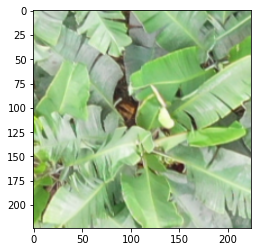

label is:  1
class predicted is:  [1.]
label is:  0
class predicted is:  [1.]


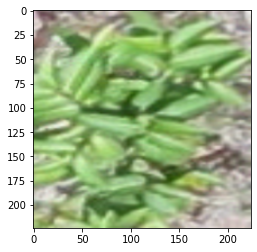

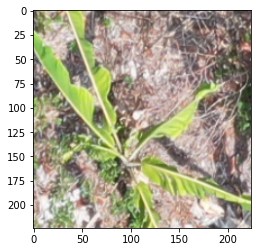

classes:  [[1.]
 [1.]
 [1.]]
y_test:  [0 1 0]
Accuracy: 0.672727
label is:  1
class predicted is:  [1.]
label is:  1
class predicted is:  [1.]


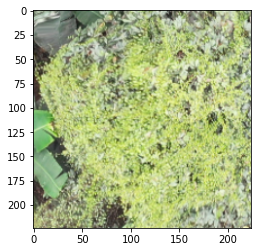

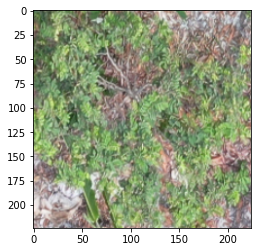

label is:  0
class predicted is:  [0.]


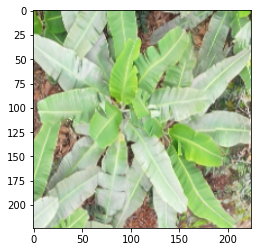

classes:  [[1.]
 [1.]
 [0.]]
y_test:  [1 1 0]
Accuracy: 0.781818
label is:  0
class predicted is:  [0.]


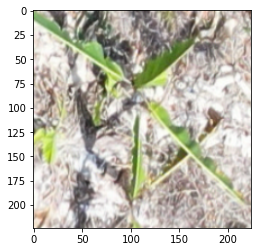

label is:  0
class predicted is:  [0.]
label is:  0
class predicted is:  [0.]
classes:  [[0.]
 [0.]
 [0.]]
y_test:  [0 0 0]
Accuracy: 0.727273


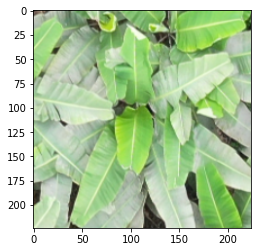

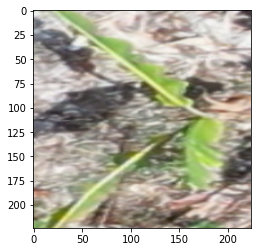

label is:  0
class predicted is:  [0.]
label is:  1
class predicted is:  [1.]


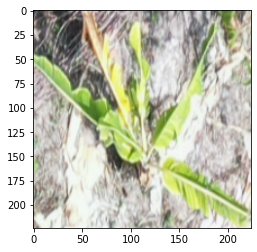

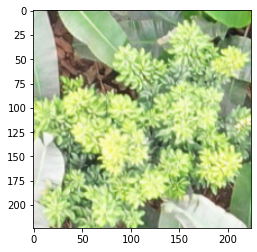

label is:  1
class predicted is:  [1.]
classes:  [[0.]
 [1.]
 [1.]]
y_test:  [0 1 1]
Accuracy: 0.672727


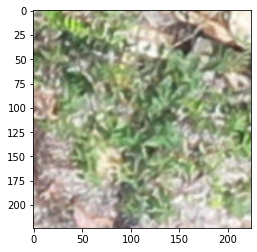

label is:  1
class predicted is:  [1.]
label is:  1
class predicted is:  [1.]


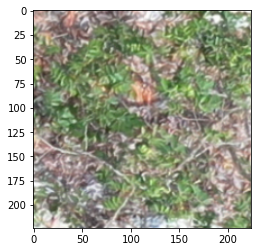

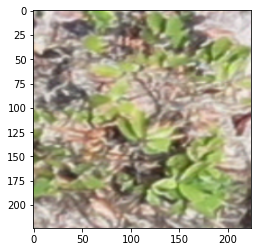

label is:  1
class predicted is:  [1.]
classes:  [[1.]
 [1.]
 [1.]]
y_test:  [1 1 1]
Accuracy: 0.709091
   accuracy  method  test
0  0.672727  ot_cnn     1
1  0.781818  ot_cnn     2
2  0.727273  ot_cnn     3
3  0.672727  ot_cnn     4
4  0.709091  ot_cnn     5


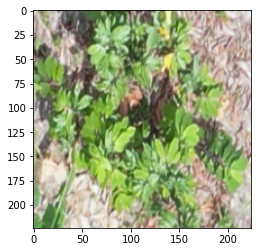

In [10]:
methods = ['hand', 'nn', 'gmn', 'gw', 'ot_greedy', 'ot_non_greedy', 'ot_cnn']

for i in range(len(methods)):
    method = methods[i]
    print(method)
    
    acc_tests = train_on_matching(methods[i], model_choice = 'basic', X_TEST = XX, y_TEST = yy)

    df_sup = pd.DataFrame()
    df_sup['accuracy'] = acc_tests
    df_sup['method'] = [methods[i]]*5
    df_sup['test'] = [1, 2, 3, 4, 5]
    df_sup.to_csv('cnn/results_basic/res_{}_basic.csv'.format(methods[i]))
    print(df_sup)
    

In [12]:
methods = ['nn', 'gmn', 'gw', 'ot_greedy', 'ot_non_greedy', 'ot_cnn']

for i in range(len(methods)):
    method = methods[i]
    print(method)
    m2 = 'hand_' + method
    acc_tests = train_on_matching(methods[i], model_choice = 'basic', X_TEST = XX, y_TEST = yy, hand = True)

    df_sup = pd.DataFrame()
    df_sup['accuracy'] = acc_tests
    df_sup['method'] = [m2]*5
    df_sup['test'] = [1, 2, 3, 4, 5]
    df_sup.to_csv('cnn/results_basic/res_hand_{}_basic.csv'.format(methods[i]))
    print(df_sup)

nn
1666 3398
[[[140.      130.      132.     ]
  [149.24052 138.47049 144.32071]
  [182.677   171.69911 176.6942 ]
  ...
  [191.04242 168.28325 163.19485]
  [171.21938 146.98941 141.0696 ]
  [182.      157.      148.     ]]

 [[133.89    123.89    119.01625]
  [151.36424 139.41795 129.57259]
  [179.78891 166.35269 160.02296]
  ...
  [188.19983 170.58986 165.18623]
  [159.06061 140.2913  133.25647]
  [167.48874 150.89    139.59875]]

 [[147.12857 134.01697 132.2125 ]
  [159.70161 145.27544 143.2372 ]
  [176.14833 161.70673 159.26485]
  ...
  [188.71324 174.66805 170.8802 ]
  [151.76299 137.95816 133.10292]
  [154.74554 142.96965 133.53125]]

 ...

 [[231.22589 224.44376 214.28572]
  [232.03032 223.8504  216.54704]
  [212.35773 205.69608 197.70015]
  ...
  [206.85808 183.05846 176.45598]
  [206.6794  183.90971 179.48128]
  [207.325   190.97144 174.84999]]

 [[229.20375 225.73126 212.09375]
  [232.92693 227.22899 217.07787]
  [224.64374 216.34648 206.05739]
  ...
  [200.39069 178.68343 17

WARNING - Callbacks method `on_train_batch_end` is slow compared to the batch time (batch time: 0.1036s vs `on_train_batch_end` time: 0.1709s). Check your callbacks.


In [ ]:
res = pd.DataFrame(columns=['accuracy', 'method', 'test'])

for file in os.listdir('cnn/results_basic'):
    if file.startswith('res_'):
        print(file)
        df_sup = pd.read_csv(os.path.join('cnn/results_basic',file), index_col = 0)
        res = pd.concat([res, df_sup], ignore_index=True)

print(res)
res.to_csv('cnn/results_basic/classification_results_basic.csv')


In [15]:
methods = ['hand', 'nn', 'gmn', 'gw', 'ot_greedy', 'ot_non_greedy', 'ot_cnn']

for i in range(len(methods)):
    method = methods[i]
    print(method)
    
    acc_tests = train_on_matching(methods[i], model_choice = 'mobilenetv2', X_TEST = XX, y_TEST = yy)

    df_sup = pd.DataFrame()
    df_sup['accuracy'] = acc_tests
    df_sup['method'] = [methods[i]]*5
    df_sup['test'] = [1, 2, 3, 4, 5]
    df_sup.to_csv('cnn/results_mobilenetv2/res_{}_mobilenetv2.csv'.format(methods[i]))
    print(df_sup)

hand
163 237
Epoch 1/5


InternalError:  Dst tensor is not initialized.
	 [[{{node IteratorGetNext/_2}}]] [Op:__inference_train_function_28261]

Function call stack:
train_function


In [ ]:
methods = ['nn', 'gmn', 'gw', 'ot_greedy', 'ot_non_greedy', 'ot_cnn']

for i in range(len(methods)):
    method = methods[i]
    print(method)
    m2 = 'hand_' + method
    acc_tests = train_on_matching(methods[i], model_choice = 'mobilenetv2', X_TEST = XX, y_TEST = yy, hand = True)

    df_sup = pd.DataFrame()
    df_sup['accuracy'] = acc_tests
    df_sup['method'] = [m2]*5
    df_sup['test'] = [1, 2, 3, 4, 5]
    df_sup.to_csv('cnn/results_mobilenetv2/res_hand_{}_mobilenetv2.csv'.format(methods[i]))
    print(df_sup)

In [ ]:
res = pd.DataFrame(columns=['accuracy', 'method', 'test'])

for file in os.listdir('cnn/results_mobilenetv2'):
    if file.startswith('res_'):
        print(file)
        df_sup = pd.read_csv(os.path.join('cnn/results_mobilenetv2',file), index_col = 0)
        res = pd.concat([res, df_sup], ignore_index=True)

print(res)
res.to_csv('cnn/results_mobilenetv2/classification_results_mobilenetv2.csv')